In [1]:
from ecog_speech import datasets, experiments, result_parsing, utils, feature_processing, pipeline, plot_label_regions
import pandas as pd
import h5py
import numpy as np

from scipy.io import loadmat

from ecog_speech import plot_label_regions
from ecog_speech import visuals as viz

from matplotlib import pyplot as plt
plt.style.use('default')

from sklearn import set_config
set_config(display="diagram")

In [2]:
hvs_tuples = datasets.HarvardSentences.make_tuples_from_sets_str('UCSD-28')
hvs_tuples

[('UCSD', 28, 1, 1)]

***

In [3]:
hvs = datasets.HarvardSentences(hvs_tuples, 
                                pre_processing_pipeline='region_classification',
                                # If set True, full sensor array is broken down into a sample per sensor, so 1D/1-channel arrays
                                flatten_sensors_to_samples=False,
                                extra_output_keys='sensor_ras_coord_arr')

2022-06-30 22:07:47,073 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:336 - DEBUG - preparing pipeline
2022-06-30 22:07:47,074 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:339 - DEBUG - Available pipelines: ['audio_gate', 'region_classification', 'region_classification_from_word_stim', 'audio_gate_speaking_only', 'default']
2022-06-30 22:07:47,075 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:347 - INFO - 'region_classification' pipeline selected
2022-06-30 22:07:47,075 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:361 - INFO - Loading data directly


Loading data:   0%|          | 0/1 [00:00<?, ?it/s]

2022-06-30 22:07:47,095 - ecog_speech.datasets.HarvardSentences.load_data:777 - INFO - ---28-1-1-UCSD---
2022-06-30 22:07:47,096 - ecog_speech.datasets.HarvardSentences.load_data:778 - INFO - |--->Using Subset: Data
2022-06-30 22:07:47,096 - ecog_speech.datasets.HarvardSentences.make_filename:1233 - INFO - Harvard sentences only uses location and patient identifiers
2022-06-30 22:07:47,097 - ecog_speech.datasets.HarvardSentences.load_data:781 - DEBUG - Path : /home/morgan/Projects/CMSCResearch/ECOGSpeech/ecog_speech/../data/HarvardSentences/UCSD/Data/UCSD28_Task_1.mat
2022-06-30 22:07:47,119 - ecog_speech.datasets.HarvardSentences.load_mat_from_path:746 - INFO - Couldn't load UCSD28_Task_1.mat with scipy (vers > 7.3?) - using package 'mat73' to load
2022-06-30 22:08:04,458 - ecog_speech.datasets.HarvardSentences.load_data:784 - DEBUG - Matlab keys : ['EKG_signal', 'Labels', 'audio', 'fs_audio', 'fs_signal', 'label_contact_common', 'label_contact_r_a_s', 'sEEG_signal', 'start_stop_word_

Processing stim regions:   0%|          | 0/50 [00:00<?, ?it/s]

2022-06-30 22:08:53,701 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1152 - INFO - Number of samples keys in sample index: {60000: 1}
2022-06-30 22:08:53,701 - ecog_speech.pipeline.WindowSampleIndicesFromStim.transform:22 - DEBUG - Updated keys: {'index_source_map', 'n_samples_per_window', 'sample_index_map'}
2022-06-30 22:08:53,702 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1095 - INFO - (512, Timedelta('0 days 00:00:00.500000'))
2022-06-30 22:08:53,702 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1096 - INFO - Samples per window: 256


Processing stim regions:   0%|          | 0/50 [00:00<?, ?it/s]

2022-06-30 22:09:04,011 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1152 - INFO - Number of samples keys in sample index: {60000: 1}
2022-06-30 22:09:04,012 - ecog_speech.pipeline.WindowSampleIndicesFromStim.transform:22 - DEBUG - Updated keys: {'index_source_map', 'n_samples_per_window', 'sample_index_map'}
2022-06-30 22:09:04,012 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1095 - INFO - (512, Timedelta('0 days 00:00:00.500000'))
2022-06-30 22:09:04,013 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1096 - INFO - Samples per window: 256


Processing stim regions:   0%|          | 0/50 [00:00<?, ?it/s]

2022-06-30 22:09:14,792 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1152 - INFO - Number of samples keys in sample index: {60000: 1}
2022-06-30 22:09:14,793 - ecog_speech.pipeline.WindowSampleIndicesFromStim.transform:22 - DEBUG - Updated keys: {'index_source_map', 'n_samples_per_window', 'sample_index_map'}
2022-06-30 22:09:14,793 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1095 - INFO - (512, Timedelta('0 days 00:00:00.500000'))
2022-06-30 22:09:14,794 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1096 - INFO - Samples per window: 256


Processing stim regions:   0%|          | 0/50 [00:00<?, ?it/s]

2022-06-30 22:09:25,205 - ecog_speech.pipeline.WindowSampleIndicesFromStim.make_sample_indices:1152 - INFO - Number of samples keys in sample index: {60000: 1}
2022-06-30 22:09:25,206 - ecog_speech.pipeline.WindowSampleIndicesFromStim.transform:22 - DEBUG - Updated keys: {'index_source_map', 'n_samples_per_window', 'sample_index_map'}
2022-06-30 22:09:25,206 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:396 - INFO - N samples per window: 256
2022-06-30 22:09:25,206 - ecog_speech.datasets.HarvardSentences.__attrs_post_init__:416 - INFO - GOOD AND BAD SENSORS: {('UCSD', 28, 1, 1): ([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101

Applying sensor selection:   0%|          | 0/1 [00:00<?, ?it/s]

2022-06-30 22:09:33,865 - ecog_speech.pipeline.ApplySensorSelection.process:142 - INFO - Selection of columns passed to sensor selection
2022-06-30 22:09:34,027 - ecog_speech.pipeline.ApplySensorSelection.process:167 - INFO - Selecting columns in RAS coordinate data
2022-06-30 22:09:34,028 - ecog_speech.pipeline.ApplySensorSelection.transform:22 - DEBUG - Updated keys: {'selected_columns', 'signal', 'sensor_ras_coord_arr', 'sensor_ras_df', 'bad_columns', 'bad_sensor_method'}


This pipeline creates all region and word stims for the different classes of listening, speaking, mouthing, imagining

In [4]:
hvs.pipeline_obj

Pipeline(steps=[('parse_signal',
                 ParseTimeSeriesArrToFrame(array_key='sEEG_signal', default_fs=1200, fs_key='fs_signal', output_key='signal')),
                ('parse_audio',
                 ParseTimeSeriesArrToFrame(array_key='audio', default_fs=48000, fs_key='fs_audio', reshape=-1)),
                ('parse_stim',
                 ParseTimeSeriesArrToFrame(array_key='stimcode', default_fs=1200, fs_key='fs_signal', output_k...
                 WindowSampleIndicesFromStim(max_target_region_size=1200, stim_key='mouthing_region_stim', stim_value_remap=2, target_offset_shift=Timedelta('-1 days +23:59:59.900000'), target_onset_shift=Timedelta('0 days 00:00:00.100000'))),
                ('imagining_indices',
                 WindowSampleIndicesFromStim(max_target_region_size=1200, stim_key='imagining_region_stim', stim_value_remap=3, target_offset_shift=Timedelta('-1 days +23:59:59.900000'), target_onset_shift=Timedelta('0 days 00:00:00.100000'))),
                ('output', 'passthrough')])

In [5]:
hvs[0]['signal_arr'].shape

torch.Size([108, 256])

****

In [6]:
data_map = hvs.data_maps[hvs_tuples[0]]

Start stop times with more region specific columns built out

In [10]:
data_map[
    'word_start_stop_times'
]

,start_t,stop_t,word,stim_sentcode,stim_sentcode_t,stim,speaking_word_length_t,time_from_speaking_start,trial_start_t,trial_stop_t,...,mouthing_region_start_t,mouthing_region_stop_t,listening_word_start_t,listening_word_stop_t,speaking_word_start_t,speaking_word_stop_t,mouthing_word_start_t,mouthing_word_stop_t,imagining_word_start_t,imagining_word_stop_t
stim_start_t,,,,,,,,,,,,,,,,,,,,,
0 days 00:00:17.529073200,0 days 00:00:17.529073200,0 days 00:00:18.397100400,on,5.0,0 days 00:00:17.496093750,51.0,0 days 00:00:00.868027200,0 days 00:00:00,0 days 00:00:13.562500,0 days 00:00:29.628906250,...,0 days 00:00:21.537109375,0 days 00:00:25.537109375,0 days 00:00:13.562500,0 days 00:00:14.430527200,0 days 00:00:17.517578125,0 days 00:00:18.385605325,0 days 00:00:21.537109375,0 days 00:00:22.405136575,0 days 00:00:25.558593750,0 days 00:00:26.426620950
0 days 00:00:18.397100400,0 days 00:00:18.397100400,0 days 00:00:18.816148,RICE,5.0,0 days 00:00:17.496093750,51.0,0 days 00:00:00.419047600,0 days 00:00:00.868027200,0 days 00:00:13.562500,0 days 00:00:29.628906250,...,0 days 00:00:21.537109375,0 days 00:00:25.537109375,0 days 00:00:14.430527200,0 days 00:00:14.849574800,0 days 00:00:18.385605325,0 days 00:00:18.804652925,0 days 00:00:22.405136575,0 days 00:00:22.824184175,0 days 00:00:26.426620950,0 days 00:00:26.845668550
0 days 00:00:18.816148,0 days 00:00:18.816148,0 days 00:00:18.995739900,IS,5.0,0 days 00:00:17.496093750,51.0,0 days 00:00:00.179591900,0 days 00:00:01.287074800,0 days 00:00:13.562500,0 days 00:00:29.628906250,...,0 days 00:00:21.537109375,0 days 00:00:25.537109375,0 days 00:00:14.849574800,0 days 00:00:15.029166700,0 days 00:00:18.804652925,0 days 00:00:18.984244825,0 days 00:00:22.824184175,0 days 00:00:23.003776075,0 days 00:00:26.845668550,0 days 00:00:27.025260450
0 days 00:00:18.995739900,0 days 00:00:18.995739900,0 days 00:00:19.514560700,OFTEN,5.0,0 days 00:00:17.496093750,51.0,0 days 00:00:00.518820800,0 days 00:00:01.466666700,0 days 00:00:13.562500,0 days 00:00:29.628906250,...,0 days 00:00:21.537109375,0 days 00:00:25.537109375,0 days 00:00:15.029166700,0 days 00:00:15.547987500,0 days 00:00:18.984244825,0 days 00:00:19.503065625,0 days 00:00:23.003776075,0 days 00:00:23.522596875,0 days 00:00:27.025260450,0 days 00:00:27.544081250
0 days 00:00:19.514560700,0 days 00:00:19.514560700,0 days 00:00:20.113200200,SERVED,5.0,0 days 00:00:17.496093750,51.0,0 days 00:00:00.598639500,0 days 00:00:01.985487500,0 days 00:00:13.562500,0 days 00:00:29.628906250,...,0 days 00:00:21.537109375,0 days 00:00:25.537109375,0 days 00:00:15.547987500,0 days 00:00:16.146627,0 days 00:00:19.503065625,0 days 00:00:20.101705125,0 days 00:00:23.522596875,0 days 00:00:24.121236375,0 days 00:00:27.544081250,0 days 00:00:28.142720750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:13:46.623697,0 days 00:13:46.623697,0 days 00:13:46.743424900,SOLD,20.0,0 days 00:13:45.583984375,51.0,0 days 00:00:00.119727900,0 days 00:00:01.007709700,0 days 00:13:41.650390625,0 days 00:14:38.906250,...,0 days 00:13:49.625000,0 days 00:13:53.625000,0 days 00:13:42.658100325,0 days 00:13:42.777828225,0 days 00:13:46.611225325,0 days 00:13:46.730953225,0 days 00:13:50.632709700,0 days 00:13:50.752437600,0 days 00:13:54.654194075,0 days 00:13:54.773921975
0 days 00:13:46.743424900,0 days 00:13:46.743424900,0 days 00:13:47.880839900,on,20.0,0 days 00:13:45.583984375,51.0,0 days 00:00:01.137415,0 days 00:00:01.127437600,0 days 00:13:41.650390625,0 days 00:14:38.906250,...,0 days 00:13:49.625000,0 days 00:13:53.625000,0 days 00:13:42.777828225,0 days 00:13:43.915243225,0 days 00:13:46.730953225,0 days 00:13:47.868368225,0 days 00:13:50.752437600,0 days 00:13:51.889852600,0 days 00:13:54.773921975,0 days 00:13:55.911336975
0 days 00:13:47.880839900,0 days 00:13:47.880839900,0 days 00:13:49.317574600,FIFTY,20.0,0 days 00:13:45.583984375,51.0,0 days 00:00:01.436734700,0 days 00:00:02.264852600,0 days 00:13:4

CPU times: user 36.4 s, sys: 18.2 s, total: 54.6 s
Wall time: 54.9 s


{'word_code_win_histo': <Figure size 640x480 with 1 Axes>,
 'sample_index_key_0': <Figure size 3500x3900 with 100 Axes>,
 'sample_index_key_1': <Figure size 3500x3900 with 100 Axes>,
 'sample_index_key_2': <Figure size 3500x3900 with 100 Axes>,
 'sample_index_key_3': <Figure size 3500x3900 with 100 Axes>}

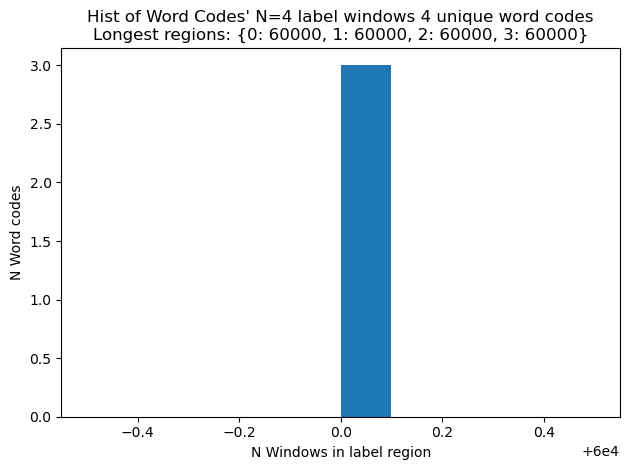

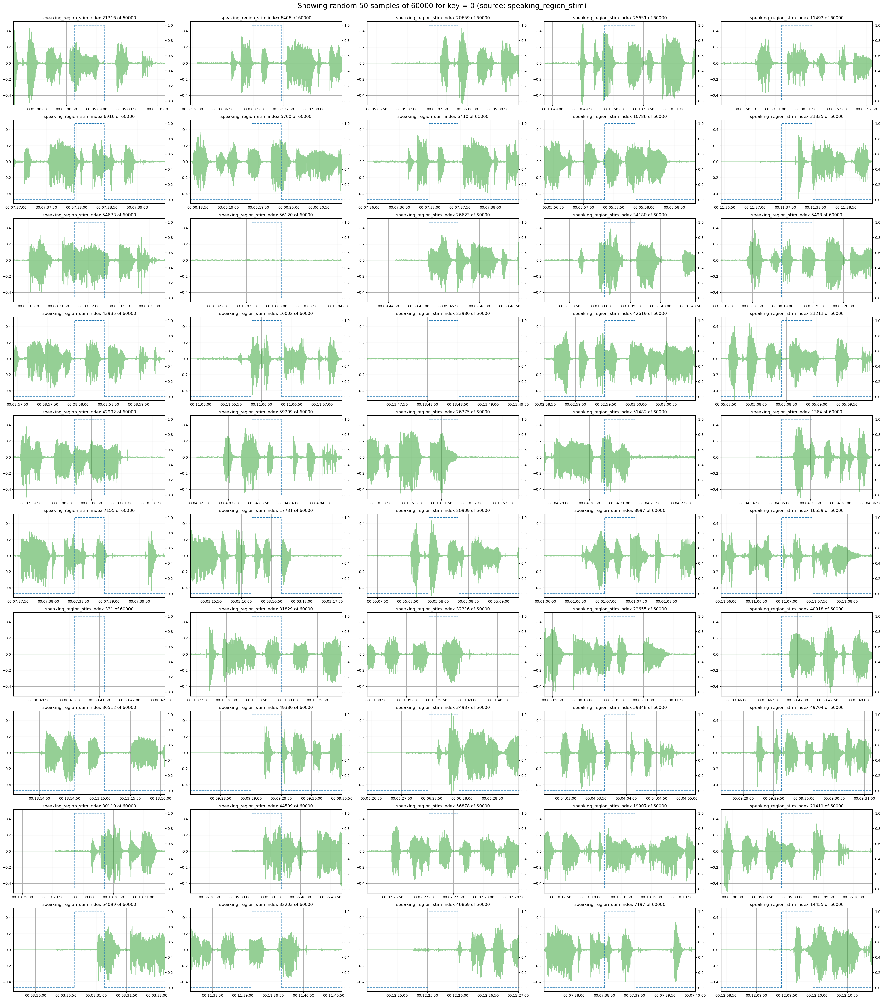

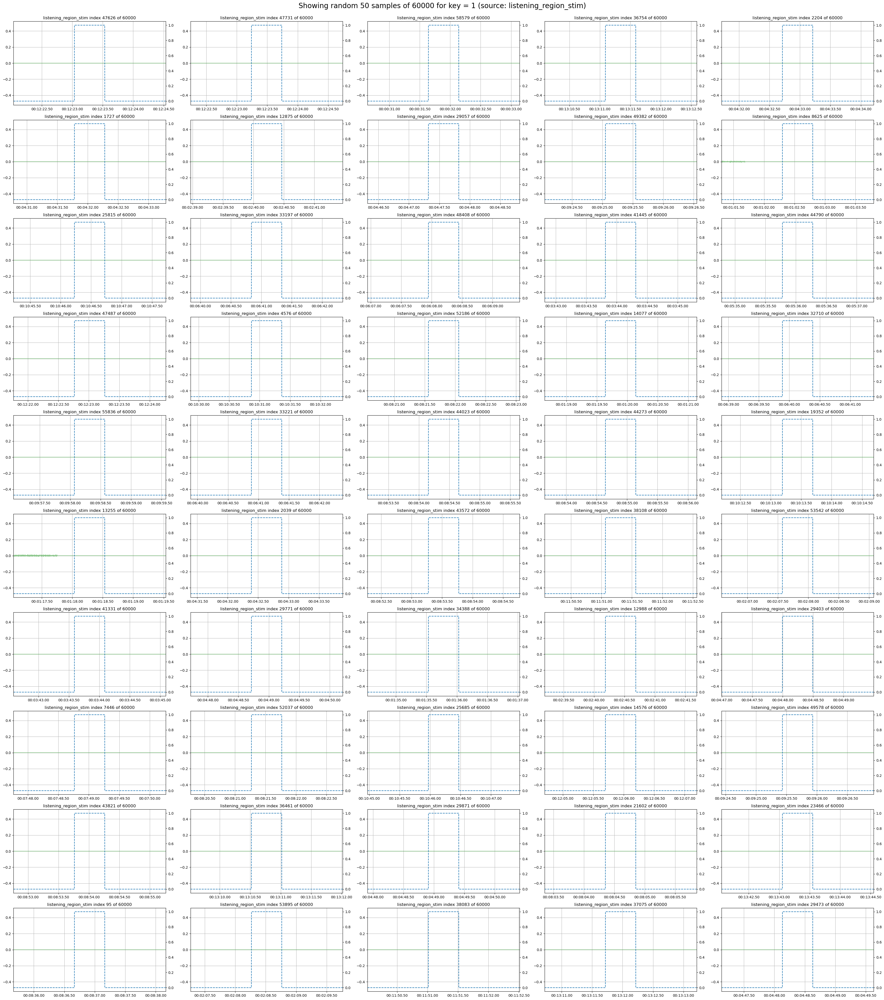

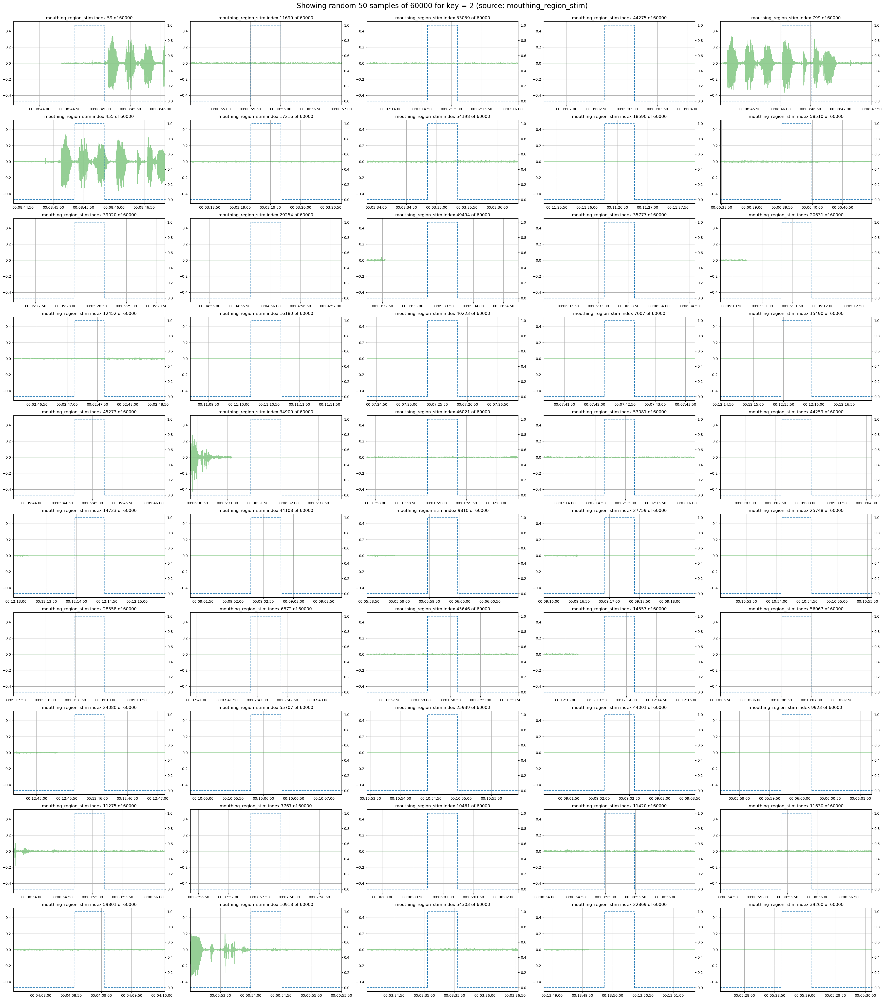

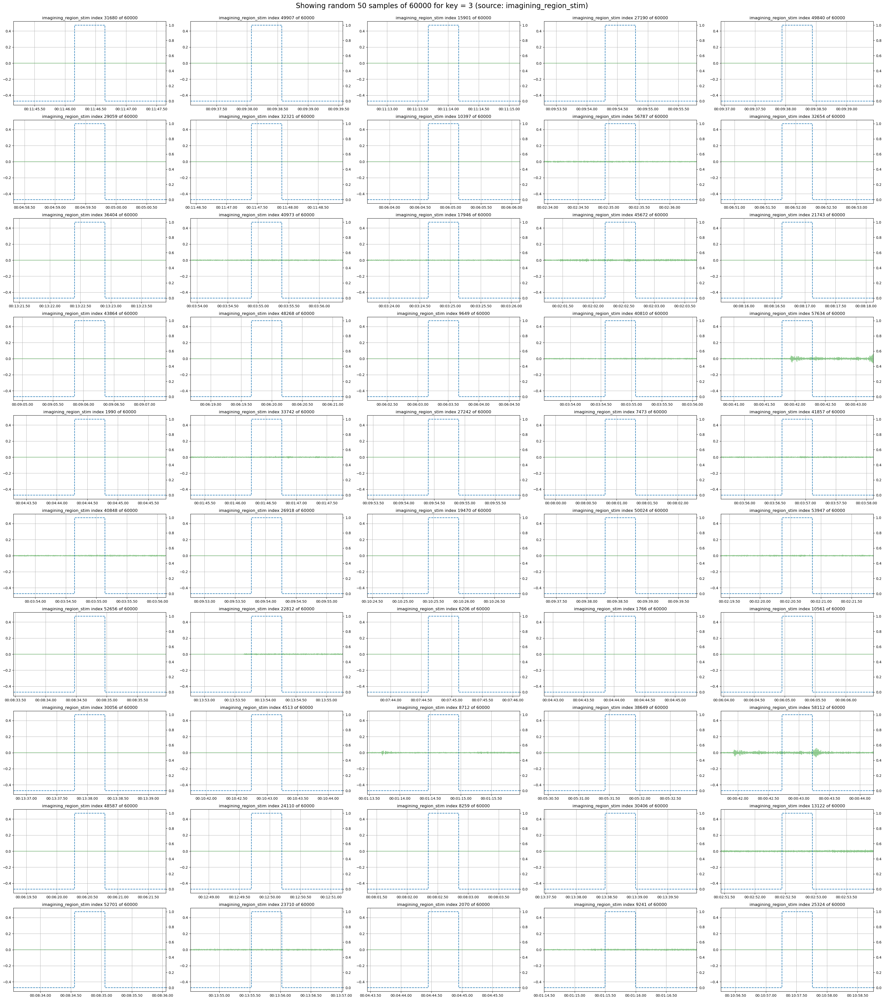

In [7]:
%%time
plot_label_regions.plot_label_inspection_figures(data_map)

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 8.62 s, sys: 915 ms, total: 9.54 s
Wall time: 9.52 s


(<Figure size 2800x6250 with 100 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>], dtype=object))

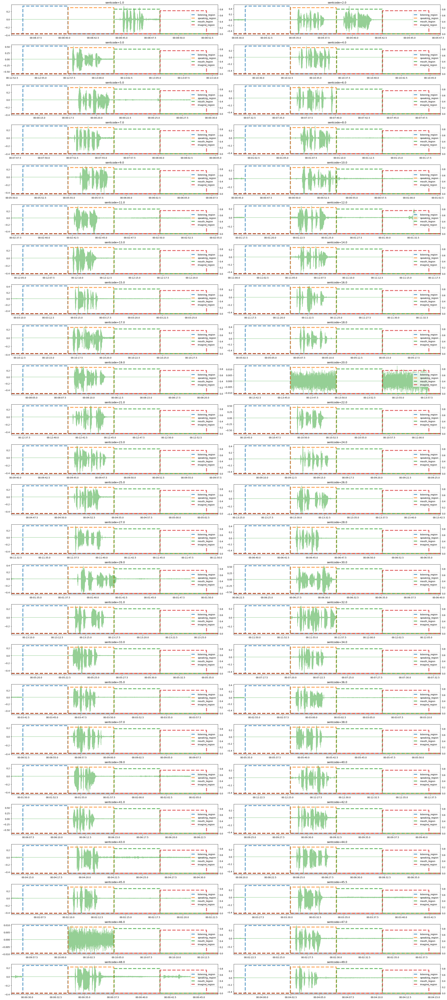

In [8]:
%%time
plot_label_regions.plot_ucsd_sentence_regions(data_map)

Processing by sentence:   0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 7.27 s, sys: 1.26 s, total: 8.53 s
Wall time: 8.52 s


(<Figure size 2700x7500 with 100 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>], dtype=object))

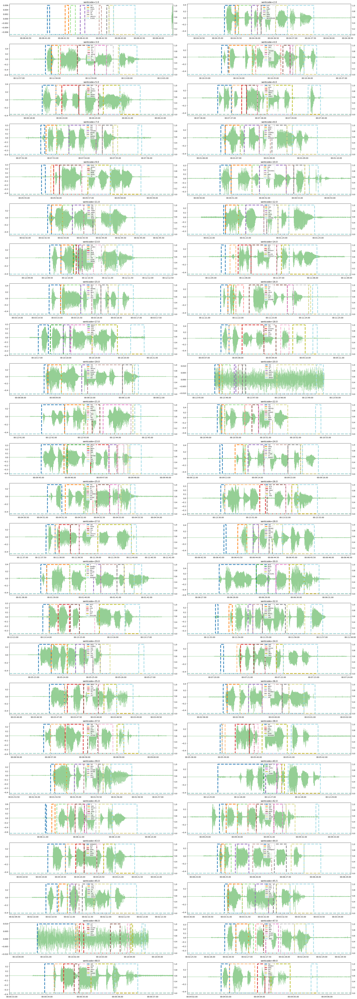

In [9]:
%%time
plot_label_regions.plot_ucsd_word_regions(data_map, 
                                          include_listen=False, include_speaking=True, include_mouth=False, include_imagine=False,
                                         #style=['-', '--'],
                                          #ls=None
                                         )

Processing by sentence:   0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 20.7 s, sys: 4.22 s, total: 24.9 s
Wall time: 24.9 s


(<Figure size 2700x7500 with 100 Axes>,
 array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>], dtype=object))

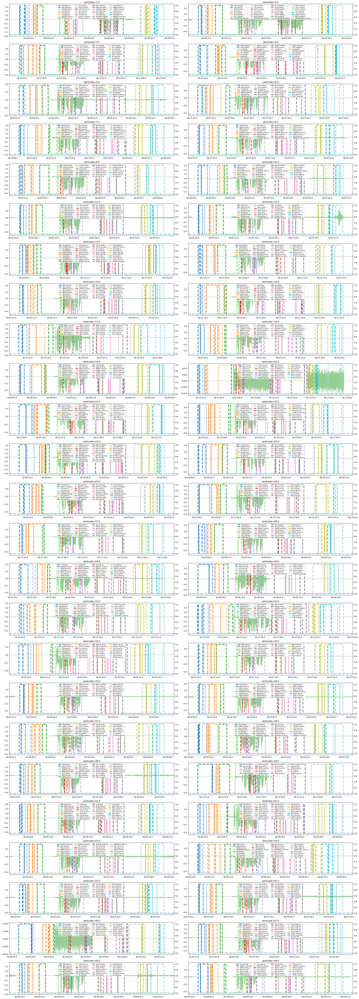

In [15]:
%%time
plot_label_regions.plot_ucsd_word_regions2(data_map, 
                                           # Comment out items from this list to reduce noise
                                           start_stop_label_tuples_l=[
                                               ('listening', 'listening_word_start_t', 'listening_word_stop_t', 'word'),
                                               ('speaking', 'speaking_word_start_t', 'speaking_word_stop_t', 'word'),
                                               ('mouthing', 'mouthing_word_start_t', 'mouthing_word_stop_t', 'word'),
                                               ('imagining', 'imagining_word_start_t', 'imagining_word_stop_t', 'word'),
                                           ],
                                         )